# Cell2location on MFI data


## Projecting MFI atlas data of donor P13 onto all relevant Visium chips (donors P13, P14 and Hrv43)

### mapping all cell states with noisy gene filtering and `run_regression` method as per: https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html


Using Visium aligned to **pre-mRNA** genome to have more features overlapping b/w reference and Visium

**With** filtering genes high in ambeint RNA (acc to LF approach, see notebook S1 in `1-1_GEX_analysis_donor_P13` analysis directory)

Final run that is being used in downstream analysis was done on **23.11.2021**, there I used trophoblast compartment from P13-only analysis (separate to all-donors anaysis) and the rest of compartments in donor P13 - from all-donors analysis


In [1]:
# from newest tutorial: https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_tutorial.html

import sys

#if branch is stable, will install via pypi, else will install from source
branch = "github"
user = "BayraktarLab"
IN_COLAB = "google.colab" in sys.modules

if IN_COLAB and branch == "stable":
    !pip install --quiet cell2location
elif IN_COLAB and branch != "stable":
    !pip install --quiet --upgrade jsonschema
    !pip install --quiet git+https://github.com/BayraktarLab/cell2location#egg=cell2location[tutorials]

import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

import cell2location
import scvi

from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42 # enables correct plotting of text
import seaborn as sns

Global seed set to 0


In [2]:
%%bash

pip freeze

absl-py==0.15.0
aiohttp==3.8.0
aiosignal==1.2.0
alabaster==0.7.12
anndata @ file:///home/conda/feedstock_root/build_artifacts/anndata_1618520057011/work
annoy @ file:///home/conda/feedstock_root/build_artifacts/python-annoy_1610271512059/work
argcomplete @ file:///home/conda/feedstock_root/build_artifacts/argcomplete_1619128689661/work
argon2-cffi @ file:///home/conda/feedstock_root/build_artifacts/argon2-cffi_1633990462919/work
arviz==0.10.0
async-generator==1.10
async-timeout==4.0.0
asynctest==0.13.0
attrs @ file:///home/conda/feedstock_root/build_artifacts/attrs_1620387926260/work
Babel @ file:///home/conda/feedstock_root/build_artifacts/babel_1619719576210/work
backcall @ file:///home/conda/feedstock_root/build_artifacts/backcall_1592338393461/work
backports.functools-lru-cache @ file:///home/conda/feedstock_root/build_artifacts/backports.functools_lru_cache_1618230623929/work
bbknn @ file:///opt/conda/conda-bld/bbknn_1623754143880/work
bleach @ file:///home/conda/feedstock_root/bu

bash: warning: setlocale: LC_ALL: cannot change locale (en_US.UTF-8)


`THEANO_FLAGS='force_device=True'` forces the package to use GPU. Pay attention to error messages that might indicate theano failed to initalise the GPU.   
Do not forget to change `device=cuda4` to your available GPU id. Use `device=cuda` / `device=cuda0` if you have just one locally or if you are requesting one GPU via HPC cluster job.

In [3]:
# read in all donors data with finalised annotation
adata = sc.read('/lustre/scratch117/cellgen/team292/aa22/adata_objects/202111_MFI_sc_sn_new_scVI_analysis/adata_raw_filtered.h5ad')


# read in final annotations, most up-to-date (19.11.2021)
final_annot = pd.read_csv('/lustre/scratch117/cellgen/team292/aa22/adata_objects/202111_MFI_sc_sn_new_scVI_analysis/final_annotation_all_cells_and_nulcei_20211119.csv', index_col=0)

# subset data to only final dropleta
adata = adata[final_annot.index,:]
adata.obs['cell_type'] = final_annot.loc[adata.obs_names,'cell_type']

adata


Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 350815 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-10', 'feature_types-10', 'genome-10', 'n_cells-10', 'gene_ids-11', 'feature_types-11', 'genome-11', 'n_cells-11', 'gene_ids-12', 'feature_types-12', 'genome-12', 'n_cells-12', 'gene_ids-13', 'feature_types-13', 'genome-13', 'n_cells-13', 'gene_ids-14', 'feature_types-14', 'genome-14', 'n_cells-14', 'gene_ids-15', 'feature_types-15', 'genome-15', 'n_cells-15', 'gene_ids-16', 'feature_types-16', 'genome-16', 'n_cells-16', 'gene_ids-17', 'feature_types-17', 'genome-17', 'n_cells-17', 'gene_ids-18', 'feature_types-18', 'genome-18', 'n_cells-18', 'gene_ids-19', 'fe

In [4]:
# donor content?
adata.obs['donor'].value_counts()

P13        67821
Hrv43      60837
P14        45166
Hrv46      29619
8          18940
10         16943
9          14869
P34        13972
12         13842
Hrv100     13708
6          11683
Hrv98      11189
Hrv99       9680
7           9596
H2          5946
H7 + H9     3608
11          3396
Name: donor, dtype: int64

In [5]:
# subset to only P13 data
adata = adata[adata.obs['donor'] == 'P13'].copy()

In [6]:
adata.obs['cell_type'].value_counts()

SCT               26428
VCT                9362
HOFB               3340
VCT_p              2636
uSMC               2442
fF1                2391
dS2                2170
iEVT               2158
dEpi_secretory     2075
dM2                1816
dM1                1808
dS1                1419
dNK1               1368
EVT_1              1209
EVT_2              1052
VCT_CCC            1039
dNK2                960
Endo_M              850
fF2                 598
VCT_fusing          570
Endo_F              492
PV                  421
MO                  221
Endo_L              181
dNK3                166
M3                  156
ILC3                125
dS3                  76
GC                   72
dT_cells             46
NK                   34
DC                   31
B_cells              21
eEVT                 19
dT_regs              18
dDC                  17
Granulocytes         11
T_cells               9
Plasma                7
dEpi_lumenal          7
Name: cell_type, dtype: int64

In [7]:
len(adata)

67821

In [16]:
# from here taking only compartments other than trophoblast
adata_P13_no_troph = adata[-adata.obs['cell_type'].isin(['VCT','VCT_p','VCT_fusing','SCT',
                                                        'VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC'])].copy()

In [17]:
len(adata_P13_no_troph)

23276

In [18]:
# this is for 20211123 run
# only final trophoblast of donor P13 from donor P13 only analysis, more confident annotations of troph here
# corrected annotations of inv troph here (esp GC and eEVT)

save_path_P13 = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

adata_P13_troph = sc.read(save_path_P13 + 'adata_raw_filtered.h5ad') # raw data

adata_P13_troph_annot_data = sc.read(save_path_P13 + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v5_final.h5ad')


adata_P13_troph = adata_P13_troph[adata_P13_troph_annot_data.obs_names,:].copy()
# transfer annotation labels
adata_P13_troph.obs['final_annot_all_troph'] = adata_P13_troph_annot_data.obs.loc[adata_P13_troph.obs_names,'final_annot_all_troph_corrected']


In [19]:
adata_P13_troph.obs['final_annot_all_troph'].value_counts()

SCT           22869
VCT            7560
VCT_p          2000
iEVT           1975
VCT_CCC        1016
EVT_2           883
EVT_1           720
VCT_fusing      523
eEVT             71
GC               58
Name: final_annot_all_troph, dtype: int64

In [20]:
# there may be some overlap due to separate analysis 
barcode_overlap = list(set(adata_P13_no_troph.obs_names) & set(adata_P13_troph.obs_names))
len(barcode_overlap)

27

In [21]:
# overall barcodes of donor P13 to carry on working with
P13_barcodes = list(set(list(adata_P13_no_troph.obs_names) + list(adata_P13_troph.obs_names)))

len(P13_barcodes)

60924

In [22]:
len(adata_P13_no_troph)

23276

In [23]:
# exclude overlapping barcodes from here
adata_P13_no_troph_no_overlap = adata_P13_no_troph[list(set(adata_P13_no_troph.obs_names) - set(barcode_overlap)),:].copy()
len(adata_P13_no_troph_no_overlap)

23249

In [26]:
# concatenate P13 troph object and other compartments object
adata_P13_full_combined = adata_P13_no_troph_no_overlap.concatenate(adata_P13_troph, join='outer')

In [27]:
len(adata_P13_full_combined)

60924

In [28]:
adata_P13_full_combined.obs['cell_type'].value_counts(dropna=False)

NaN               37675
HOFB               3340
uSMC               2442
fF1                2391
dS2                2152
dEpi_secretory     2073
dM2                1815
dM1                1808
dS1                1414
dNK1               1367
dNK2                960
Endo_M              850
fF2                 598
Endo_F              492
PV                  421
MO                  221
Endo_L              181
dNK3                166
M3                  156
ILC3                125
dS3                  76
dT_cells             46
NK                   34
DC                   31
B_cells              21
dT_regs              18
dDC                  17
Granulocytes         11
T_cells               9
Plasma                7
dEpi_lumenal          7
Name: cell_type, dtype: int64

In [31]:
adata_P13_full_combined.obs['final_annot_all_troph'].value_counts(dropna=False)

NaN           23249
SCT           22869
VCT            7560
VCT_p          2000
iEVT           1975
VCT_CCC        1016
EVT_2           883
EVT_1           720
VCT_fusing      523
eEVT             71
GC               58
Name: final_annot_all_troph, dtype: int64

In [33]:
str(adata_P13_full_combined.obs['final_annot_all_troph'][0])

'nan'

In [34]:
# if there is a nan in 'cell_type', use annotation from final_annot_all_troph
adata_P13_full_combined.obs['cell_type_full'] = [adata_P13_full_combined.obs.loc[barcode_sample,'final_annot_all_troph'] if str(adata_P13_full_combined.obs.loc[barcode_sample,'cell_type']) == 'nan' else adata_P13_full_combined.obs.loc[barcode_sample,'cell_type'] for barcode_sample in adata_P13_full_combined.obs_names]


In [35]:
adata_P13_full_combined.obs['cell_type_full'].value_counts(dropna=False)

SCT               22869
VCT                7560
HOFB               3340
uSMC               2442
fF1                2391
dS2                2152
dEpi_secretory     2073
VCT_p              2000
iEVT               1975
dM2                1815
dM1                1808
dS1                1414
dNK1               1367
VCT_CCC            1016
dNK2                960
EVT_2               883
Endo_M              850
EVT_1               720
fF2                 598
VCT_fusing          523
Endo_F              492
PV                  421
MO                  221
Endo_L              181
dNK3                166
M3                  156
ILC3                125
dS3                  76
eEVT                 71
GC                   58
dT_cells             46
NK                   34
DC                   31
B_cells              21
dT_regs              18
dDC                  17
Granulocytes         11
T_cells               9
dEpi_lumenal          7
Plasma                7
Name: cell_type_full, dtype: int64

In [36]:
adata_ref = adata_P13_full_combined.copy()

In [37]:
adata_ref

AnnData object with n_obs × n_vars = 60924 × 30800
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'cell_type', 'tissue_block', 'age', 'technique', 'final_annot_all_troph', 'cell_type_full'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'genome-0-0', 'n_cells-0-0', 'gene_ids-1-0', 'feature_types-1-0', 'genome-1-0', 'n_cells-1-0', 'gene_ids-10-0', 'feature_types-10-0', 'genome-10-0', 'n_cells-10-0', 'gene_ids-11-0', 'feature_types-11-0', 'genome-11-0', 'n_cells-11-0', 'gene_ids-12-0', 'feature_types-12-0', 'genome-12-0', 'n_cells-12-0', 'gene_ids-13-0', 'feature_types-13-0', 'genome-13-0', 'n_cells-13-0', 'gene_ids-14-0', 'feature_types-14-0', 'genome-14-0', 'n_cells-14-0', 'gene_ids-15-0', 'feature_types-15-0', 'genome-15-0', 'n_cells-15-0', 'gene_ids-16-0', 'feature_types-16-0', 'genome-16-0', 'n_cells

In [38]:
adata_ref.obs['cell_type'] = adata_ref.obs['cell_type_full']

In [39]:
np.unique(adata_ref.obs['cell_type'], return_counts=True)

(array(['B_cells', 'DC', 'EVT_1', 'EVT_2', 'Endo_F', 'Endo_L', 'Endo_M',
        'GC', 'Granulocytes', 'HOFB', 'ILC3', 'M3', 'MO', 'NK', 'PV',
        'Plasma', 'SCT', 'T_cells', 'VCT', 'VCT_CCC', 'VCT_fusing',
        'VCT_p', 'dDC', 'dEpi_lumenal', 'dEpi_secretory', 'dM1', 'dM2',
        'dNK1', 'dNK2', 'dNK3', 'dS1', 'dS2', 'dS3', 'dT_cells', 'dT_regs',
        'eEVT', 'fF1', 'fF2', 'iEVT', 'uSMC'], dtype=object),
 array([   21,    31,   720,   883,   492,   181,   850,    58,    11,
         3340,   125,   156,   221,    34,   421,     7, 22869,     9,
         7560,  1016,   523,  2000,    17,     7,  2073,  1808,  1815,
         1367,   960,   166,  1414,  2152,    76,    46,    18,    71,
         2391,   598,  1975,  2442]))

In [40]:
adata_ref.obs['barcode_sample_copy'] = adata_ref.obs.index

In [41]:
save_path_soupy_genes = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

________

### Soupy gene filtering

In [42]:
# reding in noisy gene filter (as per LF approach, only done on donor P13)
gene_filter_P13 = pd.read_csv(save_path_soupy_genes + 'gene_filter_nuclei_donor_P13_all_samples.csv', index_col=0)

In [43]:
np.unique(gene_filter_P13['Selected'], return_counts=True)

(array([False,  True]), array([18992, 16335]))

In [44]:
# just getting the overlap of genes to keep and keeping only them
genes2keep_sn = list(gene_filter_P13[gene_filter_P13['Selected'] == True].index)

print(len(genes2keep_sn), 'genes2keep_sn')

16335 genes2keep_sn


In [45]:
# overlap with current features in adata
genes_overlap2keep = list(set(genes2keep_sn) & set(adata_ref.var_names))

In [46]:
len(genes_overlap2keep)

14620

In [47]:
# filtering out noisy genes
adata_ref = adata_ref[:,genes_overlap2keep].copy()

_____________

In [48]:
# filtering out lowly expressed genes 
sc.pp.filter_genes(adata_ref, min_cells=3)

/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:251: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`


In [49]:
adata_ref

AnnData object with n_obs × n_vars = 60924 × 14476
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'cell_type', 'tissue_block', 'age', 'technique', 'final_annot_all_troph', 'cell_type_full', 'barcode_sample_copy'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'genome-0-0', 'n_cells-0-0', 'gene_ids-1-0', 'feature_types-1-0', 'genome-1-0', 'n_cells-1-0', 'gene_ids-10-0', 'feature_types-10-0', 'genome-10-0', 'n_cells-10-0', 'gene_ids-11-0', 'feature_types-11-0', 'genome-11-0', 'n_cells-11-0', 'gene_ids-12-0', 'feature_types-12-0', 'genome-12-0', 'n_cells-12-0', 'gene_ids-13-0', 'feature_types-13-0', 'genome-13-0', 'n_cells-13-0', 'gene_ids-14-0', 'feature_types-14-0', 'genome-14-0', 'n_cells-14-0', 'gene_ids-15-0', 'feature_types-15-0', 'genome-15-0', 'n_cells-15-0', 'gene_ids-16-0', 'feature_types-16-0', 

In [50]:
adata_ref.var['SYMBOL'] = adata_ref.var.index

/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/ipykernel_launcher.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`


In [51]:
adata_ref.raw = adata_ref.copy()

In [52]:
adata_ref.raw.var

,gene_ids-0-0,feature_types-0-0,genome-0-0,n_cells-0-0,gene_ids-1-0,feature_types-1-0,genome-1-0,n_cells-1-0,gene_ids-10-0,feature_types-10-0,...,gene_ids-6-1,feature_types-6-1,genome-6-1,n_cells-6-1,gene_ids-7-1,feature_types-7-1,genome-7-1,n_cells-7-1,n_cells,SYMBOL
TESC-AS1,nan,nan,nan,NaN,nan,nan,nan,NaN,nan,nan,...,ENSG00000258285,Gene Expression,GRCh38,55.0,ENSG00000258285,Gene Expression,GRCh38,38.0,559,TESC-AS1
PYGB,ENSG00000100994,Gene Expression,GRCh38,31.0,ENSG00000100994,Gene Expression,GRCh38,73.0,ENSG00000100994,Gene Expression,...,ENSG00000100994,Gene Expression,GRCh38,1150.0,ENSG00000100994,Gene Expression,GRCh38,1083.0,5884,PYGB
SCAI,ENSG00000173611,Gene Expression,GRCh38,17.0,ENSG00000173611,Gene Expression,GRCh38,43.0,ENSG00000173611,Gene Expression,...,ENSG00000173611,Gene Expression,GRCh38,1172.0,ENSG00000173611,Gene Expression,GRCh38,1240.0,9052,SCAI
AC012613.1,nan,nan,nan,NaN,nan,nan,nan,NaN,nan,nan,...,ENSG00000248647,Gene Expression,GRCh38,60.0,ENSG00000248647,Gene Expression,GRCh38,53.0,388,AC012613.1
LINC01537,nan,nan,nan,NaN,ENSG00000227467,Gene Expression,GRCh38,3.0,nan,nan,...,ENSG00000227467,Gene Expression,GRCh38,6.0,ENSG00000227467,Gene Expression,GRCh38,5.0,12,LINC01537
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PLEKHB2,ENSG00000115762,Gene Expression,GRCh38,95.0,ENSG00000115762,Gene Expression,GRCh38,206.0,ENSG00000115762,Gene Expression,...,ENSG00000115762,Gene Expression,GRCh38,2891.0,ENSG00000115762,Gene Expression,GRCh38,2998.0,21187,PLEKHB2
SVEP1,nan,nan,nan,NaN,nan,nan,nan,NaN,ENSG00000165124,Gene Expression,...,ENSG00000165124,Gene Expression,GRCh38,3441.0,ENSG00000165124,Gene Expression,GRCh38,3474.0,28564,SVEP1
FOXN4,nan,nan,nan,NaN,nan,nan,nan,NaN,nan,nan,...,ENSG00000139445,Gene Expression,GRCh38,13.0,ENSG00000139445,Gene Expression,GRCh38,13.0,118,FOXN4
ADORA1,nan,nan,nan,NaN,nan,nan,nan,NaN,ENSG00000163485,Gene Expression,...,ENSG00000163485,Gene Expression,GRCh38,740.0,ENSG00000163485,Gene Expression,GRCh38,777.0,4541,ADORA1


## Estimation of reference cell type signatures (NB regression)

In [53]:
results_folder = '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter/'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

In [54]:
# prepare anndata for the regression model
scvi.data.setup_anndata(adata=adata_ref,
                        # 10X reaction / sample / batch
                        batch_key='sample',
                        # cell type, covariate used for constructing signatures
                        labels_key='cell_type',
                        # multiplicative technical effects (platform, 3' vs 5', donor effect)
                        #categorical_covariate_keys=['Method']
                       )
scvi.data.view_anndata_setup(adata_ref)

INFO     Using batches from adata.obs["sample"]                                              
INFO     Using labels from adata.obs["cell_type"]                                            
INFO     Using data from adata.X                                                             


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function setup_anndata is deprecated; Please use the model-specific setup_anndata methods instead. The global method will be removed in version 0.15.0.


INFO     Successfully registered anndata object containing 60924 cells, 14476 vars, 10       
         batches, 40 labels, and 0 proteins. Also registered 0 extra categorical covariates  
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function view_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.


Anndata setup with scvi-tools version 0.14.3.

              Data Summary              
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃             Data             ┃ Count ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│            Cells             │ 60924 │
│             Vars             │ 14476 │
│            Labels            │  40   │
│           Batches            │  10   │
│           Proteins           │   0   │
│ Extra Categorical Covariates │   0   │
│ Extra Continuous Covariates  │   0   │
└──────────────────────────────┴───────┘

             SCVI Data Registry              
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃     Data      ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       X       │          adata.X          │
│ batch_indices │ adata.obs['_scvi_batch']  │
│    labels     │ adata.obs['_scvi_labels'] │
└───────────────┴───────────────────────────┘

                        Label Categories                         
┏━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃    Source Location     ┃   Categories   ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['cell_type'] │    B_cells     │          0          │
│                        │       DC       │          1          │
│                        │     EVT_1      │          2          │
│                        │     EVT_2      │          3          │
│                        │     Endo_F     │          4          │
│                        │     Endo_L     │          5          │
│                        │     Endo_M     │          6          │
│                        │       GC       │          7          │
│                        │  Granulocytes  │          8          │
│                        │      HOFB      │          9          │
│                        │      ILC3      │         10          │
│                        │       M3       │         11          │
│                        │       MO       │         12          │
│                        │       NK       │         13          │
│                        │       PV       │         14          │
│                        │     Plasma     │         15          │
│                        │      SCT       │         16          │
│                        │    T_cells     │         17          │
│                        │      VCT       │         18          │
│                        │    VCT_CCC     │         19          │
│                        │   VCT_fusing   │         20          │
│                        │     VCT_p      │         21          │
│                        │      dDC       │         22          │
│                        │  dEpi_lumenal  │         23          │
│                        │ dEpi_secretory │         24          │
│                        │      dM1       │         25          │
│                        │      dM2       │         26          │
│                        │      dNK1      │         27          │
│                        │      dNK2      │         28          │
│                        │      dNK3      │         29          │
│                        │      dS1       │         30          │
│                        │      dS2       │         31          │
│                        │      dS3       │         32          │
│                        │    dT_cells    │         33          │
│                        │    dT_regs     │         34          │
│                        │      eEVT      │         35          │
│                        │      fF1       │         36          │
│                        │      fF2       │         37          │
│                        │      iEVT      │         38          │
│                        │      uSMC      │         39          │
└────────────────────────┴────────────────┴─────────────────────┘

                                     Batch Categories                                      
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃                 Categories                  ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │              Pla_Camb10691970               │          0          │
│                     │              Pla_Camb10691971               │          1          │
│                     │              Pla_Camb10714919               │          2          │
│                     │ Pla_Camb10714919_and_40110_Pla_Camb10687915 │          3          │
│                     │              Pla_Camb10714920               │          4          │
│                     │ Pla_Camb10714920_and_40110_Pla_Camb10687916 │          5          │
│                     │               WSSS_PLA8764121               │          6          │
│                     │               WSSS_PLA8764122               │          7          │
│                     │               WSSS_PLA8810750               │          8          │
│                     │               WSSS_PLA8810751               │          9          │
└─────────────────────┴─────────────────────────────────────────────┴─────────────────────┘

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:99: UserWarning: you passed in a val_dataloader but have no validation_step. Skipping val loop
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 250/250: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 250/250 [26:07<00:00,  6.27s/it, v_num=1, elbo_train=3e+8]


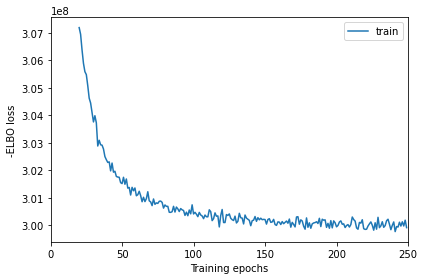

In [55]:
# create and train the regression model
from cell2location.models import RegressionModel
mod = RegressionModel(adata_ref)

# Use all data for training (validation not implemented yet, train_size=1)
mod.train(max_epochs=250, batch_size=2500, train_size=1, lr=0.002, use_gpu=True)

# plot ELBO loss history during training, removing first 20 epochs from the plot
mod.plot_history(20)

In [56]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_ref = mod.export_posterior(
    adata_ref, sample_kwargs={'num_samples': 1000, 'batch_size': 2500, 'use_gpu': True}
)

# Save model
mod.save(f"{ref_run_name}", overwrite=True)

# Save anndata object with results
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref.write(adata_file)
adata_file

Sampling global variables, sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 999/999 [00:12<00:00, 79.24it/s]


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'sample' as categorical
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'dataset' as categorical
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'cell_type' as categorical
/opt/conda/envs/ce

'/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//reference_signatures/sc.h5ad'

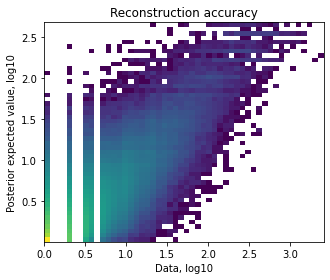

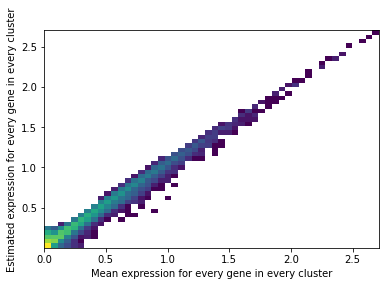

In [57]:
# Examine QC plots

mod.plot_QC()

In [58]:
# reading in previous object
adata_file = f"{ref_run_name}/sc.h5ad"
adata_ref = sc.read(adata_file)

In [59]:
adata_ref

AnnData object with n_obs × n_vars = 60924 × 14476
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'cell_type', 'tissue_block', 'age', 'technique', 'final_annot_all_troph', 'cell_type_full', 'barcode_sample_copy', '_scvi_batch', '_scvi_labels', '_indices'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'genome-0-0', 'n_cells-0-0', 'gene_ids-1-0', 'feature_types-1-0', 'genome-1-0', 'n_cells-1-0', 'gene_ids-10-0', 'feature_types-10-0', 'genome-10-0', 'n_cells-10-0', 'gene_ids-11-0', 'feature_types-11-0', 'genome-11-0', 'n_cells-11-0', 'gene_ids-12-0', 'feature_types-12-0', 'genome-12-0', 'n_cells-12-0', 'gene_ids-13-0', 'feature_types-13-0', 'genome-13-0', 'n_cells-13-0', 'gene_ids-14-0', 'feature_types-14-0', 'genome-14-0', 'n_cells-14-0', 'gene_ids-15-0', 'feature_types-15-0', 'genome-15-0', 'n_cells-15-

In [60]:
np.unique(adata_ref.obs['cell_type'])

array(['B_cells', 'DC', 'EVT_1', 'EVT_2', 'Endo_F', 'Endo_L', 'Endo_M',
       'GC', 'Granulocytes', 'HOFB', 'ILC3', 'M3', 'MO', 'NK', 'PV',
       'Plasma', 'SCT', 'T_cells', 'VCT', 'VCT_CCC', 'VCT_fusing',
       'VCT_p', 'dDC', 'dEpi_lumenal', 'dEpi_secretory', 'dM1', 'dM2',
       'dNK1', 'dNK2', 'dNK3', 'dS1', 'dS2', 'dS3', 'dT_cells', 'dT_regs',
       'eEVT', 'fF1', 'fF2', 'iEVT', 'uSMC'], dtype=object)

In [61]:
# export estimated expression in each cluster
if 'means_per_cluster_mu_fg' in adata_ref.varm.keys():
    inf_aver = adata_ref.varm['means_per_cluster_mu_fg'][[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
else:
    inf_aver = adata_ref.var[[f'means_per_cluster_mu_fg_{i}'
                                    for i in adata_ref.uns['mod']['factor_names']]].copy()
inf_aver.columns = adata_ref.uns['mod']['factor_names']
inf_aver

,B_cells,DC,EVT_1,EVT_2,Endo_F,Endo_L,Endo_M,GC,Granulocytes,HOFB,...,dS1,dS2,dS3,dT_cells,dT_regs,eEVT,fF1,fF2,iEVT,uSMC
TESC-AS1,0.125122,0.075922,0.020338,0.021238,0.009507,0.010734,0.006193,0.025689,0.461822,0.003369,...,0.004289,0.001632,0.060027,0.041715,0.150651,0.034443,0.002051,0.004349,0.020955,0.003406
PYGB,0.256945,0.061272,0.157707,0.306625,0.077428,0.148370,0.063817,0.362832,0.134988,0.099680,...,0.128245,0.080902,0.339816,0.051140,0.073052,0.323531,0.084403,0.097212,0.358753,0.265670
SCAI,0.546868,0.160316,0.559738,0.503231,0.448291,0.490948,0.266484,0.144139,0.152003,0.410444,...,0.250936,0.173794,0.373674,0.182191,0.289895,0.536106,0.297235,0.140099,0.393160,0.169222
AC012613.1,0.094472,0.056101,0.002912,0.004046,0.138304,0.114919,0.042440,0.024125,0.276812,0.024104,...,0.016866,0.039673,0.393154,0.041278,0.127609,0.059543,0.003746,0.009433,0.004391,0.007939
LINC01537,0.160228,0.103849,0.001750,0.001431,0.002991,0.009569,0.002859,0.030501,0.317622,0.000379,...,0.000991,0.001000,0.027006,0.056758,0.167526,0.026245,0.000626,0.004294,0.000709,0.000495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
PLEKHB2,0.525427,0.286598,0.654124,1.489921,0.268032,0.296205,0.257642,0.810947,0.130550,0.506361,...,0.194277,0.264840,0.449753,0.096621,0.063167,2.229642,0.298043,0.202543,2.645945,0.136150
SVEP1,0.236869,0.188037,0.221690,0.190089,0.231797,0.848802,0.189513,0.222429,0.598462,0.349925,...,1.596770,1.040966,1.153199,0.654655,0.202365,0.355307,5.514007,0.805520,0.310717,0.270731
FOXN4,0.054241,0.040847,0.003938,0.003341,0.004358,0.007087,0.002305,0.017074,0.134577,0.000826,...,0.009884,0.009659,0.032952,0.025969,0.073137,0.016084,0.001357,0.007906,0.001442,0.014244
ADORA1,0.069712,0.046002,0.019814,0.012300,0.012807,0.012319,0.012453,0.050146,0.167240,0.010885,...,0.006248,0.025464,0.017517,0.031825,0.182097,2.207697,0.051957,0.096425,0.031207,0.004645


### Reading in Visium data, pre-mRNA alignment

In [62]:
# reading adatas 
# trying all at once, this may break
IDs = ['34914_WS_PLA_S9101764', # P13 main 4 chips
           '34914_WS_PLA_S9101765',
           '34914_WS_PLA_S9101766',
           '34914_WS_PLA_S9101767',
           '34882_WS_PLA_S9101769', # P14 2 chips
           '34882_WS_PLA_S9101770',
           
           # from batch 2
           '36173_Pla_HDBR9518710', # Hrv43
           '36173_Pla_Camb9518737', # P13 extra chip
           
          ]

adatas_visium = {}

for ID in IDs:
    print(ID)
    
    if ID in ['34914_WS_PLA_S9101764', # P13 main 4 chips
           '34914_WS_PLA_S9101765',
           '34914_WS_PLA_S9101766',
           '34914_WS_PLA_S9101767',
           '34882_WS_PLA_S9101769', # P!4 2 chips
           '34882_WS_PLA_S9101770',]:
        path = '/lustre/scratch117/cellgen/team292/aa22/data/202008_MFI_Visium/20200901_new_data_spaceranger110/spaceranger110_count_' + ID + '_GRCh38-3_0_0-premrna/'
    if ID in ['36173_Pla_HDBR9518710', # Hrv43
           '36173_Pla_Camb9518737', # P13 extra chip
             ]:
        path = '/lustre/scratch117/cellgen/team292/aa22/data/202103_MFI_Visium_batch_2/spaceranger110_count_' + ID + '_GRCh38-3_0_0_premrna/'
           
    
    adatas_visium[ID] = sc.read_visium(path)
    adatas_visium[ID].obs['sample'] = ID
    adatas_visium[ID].obs['barcode_sample'] = [idx + '_' + ID for idx in adatas_visium[ID].obs_names]
    adatas_visium[ID].var_names_make_unique()
    

34914_WS_PLA_S9101764


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34914_WS_PLA_S9101765


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34914_WS_PLA_S9101766


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34914_WS_PLA_S9101767


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34882_WS_PLA_S9101769


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34882_WS_PLA_S9101770


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


36173_Pla_HDBR9518710


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


36173_Pla_Camb9518737


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [63]:
# concatenate into 1 object
adata_visium = adatas_visium['34914_WS_PLA_S9101764'].concatenate([adatas_visium['34914_WS_PLA_S9101765'],
                                                adatas_visium['34914_WS_PLA_S9101766'],
                                                adatas_visium['34914_WS_PLA_S9101767'],
                                               adatas_visium['34882_WS_PLA_S9101769'],
                                               adatas_visium['34882_WS_PLA_S9101770'],
                                               adatas_visium['36173_Pla_HDBR9518710'],
                                               adatas_visium['36173_Pla_Camb9518737']],join='outer',index_unique=None)


Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [64]:
adata_visium.obs

,in_tissue,array_row,array_col,sample,barcode_sample,batch
AAACAAGTATCTCCCA-1,1,50,102,34914_WS_PLA_S9101764,AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764,0
AAACAATCTACTAGCA-1,1,3,43,34914_WS_PLA_S9101764,AAACAATCTACTAGCA-1_34914_WS_PLA_S9101764,0
AAACACCAATAACTGC-1,1,59,19,34914_WS_PLA_S9101764,AAACACCAATAACTGC-1_34914_WS_PLA_S9101764,0
AAACAGAGCGACTCCT-1,1,14,94,34914_WS_PLA_S9101764,AAACAGAGCGACTCCT-1_34914_WS_PLA_S9101764,0
AAACAGCTTTCAGAAG-1,1,43,9,34914_WS_PLA_S9101764,AAACAGCTTTCAGAAG-1_34914_WS_PLA_S9101764,0
...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1,1,31,77,36173_Pla_Camb9518737,TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737,7
TTGTTTCACATCCAGG-1,1,58,42,36173_Pla_Camb9518737,TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737,7
TTGTTTCATTAGTCTA-1,1,60,30,36173_Pla_Camb9518737,TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737,7
TTGTTTCCATACAACT-1,1,45,27,36173_Pla_Camb9518737,TTGTTTCCATACAACT-1_36173_Pla_Camb9518737,7


In [65]:
np.unique(adata_visium.obs['sample'], return_counts=True)

(array(['34882_WS_PLA_S9101769', '34882_WS_PLA_S9101770',
        '34914_WS_PLA_S9101764', '34914_WS_PLA_S9101765',
        '34914_WS_PLA_S9101766', '34914_WS_PLA_S9101767',
        '36173_Pla_Camb9518737', '36173_Pla_HDBR9518710'], dtype=object),
 array([3130, 3355, 3568, 3855, 3879, 4186, 4071, 1216]))

In [66]:
np.unique(adata_visium.obs.index, return_counts=True)

(array(['AAACAACGAATAGTTC-1', 'AAACAAGTATCTCCCA-1', 'AAACAATCTACTAGCA-1',
        ..., 'TTGTTTCCATACAACT-1', 'TTGTTTGTATTACACG-1',
        'TTGTTTGTGTAAATTC-1'], dtype=object),
 array([1, 8, 2, ..., 7, 2, 4]))

In [67]:
adata_ref

AnnData object with n_obs × n_vars = 60924 × 14476
    obs: 'n_genes', 'sample', 'technology', 'tissue', 'dev_age', 'donor', 'dataset', 'run', 'number_of_individuals_multiplexed', 'batch', 'percent_mito', 'n_counts', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'is_doublet', 'cell_type', 'tissue_block', 'age', 'technique', 'final_annot_all_troph', 'cell_type_full', 'barcode_sample_copy', '_scvi_batch', '_scvi_labels', '_indices'
    var: 'gene_ids-0-0', 'feature_types-0-0', 'genome-0-0', 'n_cells-0-0', 'gene_ids-1-0', 'feature_types-1-0', 'genome-1-0', 'n_cells-1-0', 'gene_ids-10-0', 'feature_types-10-0', 'genome-10-0', 'n_cells-10-0', 'gene_ids-11-0', 'feature_types-11-0', 'genome-11-0', 'n_cells-11-0', 'gene_ids-12-0', 'feature_types-12-0', 'genome-12-0', 'n_cells-12-0', 'gene_ids-13-0', 'feature_types-13-0', 'genome-13-0', 'n_cells-13-0', 'gene_ids-14-0', 'feature_types-14-0', 'genome-14-0', 'n_cells-14-0', 'gene_ids-15-0', 'feature_types-15-0', 'genome-15-0', 'n_cells-15-

In [68]:
list(np.unique(adata_ref.obs['cell_type']))

['B_cells',
 'DC',
 'EVT_1',
 'EVT_2',
 'Endo_F',
 'Endo_L',
 'Endo_M',
 'GC',
 'Granulocytes',
 'HOFB',
 'ILC3',
 'M3',
 'MO',
 'NK',
 'PV',
 'Plasma',
 'SCT',
 'T_cells',
 'VCT',
 'VCT_CCC',
 'VCT_fusing',
 'VCT_p',
 'dDC',
 'dEpi_lumenal',
 'dEpi_secretory',
 'dM1',
 'dM2',
 'dNK1',
 'dNK2',
 'dNK3',
 'dS1',
 'dS2',
 'dS3',
 'dT_cells',
 'dT_regs',
 'eEVT',
 'fF1',
 'fF2',
 'iEVT',
 'uSMC']

In [69]:
adata_visium

AnnData object with n_obs × n_vars = 27260 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'barcode_sample', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [70]:
np.unique(adata_visium.obs['sample'])

array(['34882_WS_PLA_S9101769', '34882_WS_PLA_S9101770',
       '34914_WS_PLA_S9101764', '34914_WS_PLA_S9101765',
       '34914_WS_PLA_S9101766', '34914_WS_PLA_S9101767',
       '36173_Pla_Camb9518737', '36173_Pla_HDBR9518710'], dtype=object)

In [71]:
adata_visium.raw = adata_visium.copy()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [72]:
# saving barcodes for later
# already done
adata_visium.obs.to_csv('/nfs/team292/aa22/spatial_deconvolution_related/202008_real_MFI_Visium/202111_new_analysis_all_samples/adata_visium_all_8_chips_using_20211123.csv')

adata_visium

AnnData object with n_obs × n_vars = 27260 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'barcode_sample', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'
    obsm: 'spatial'

In [73]:
# Doing some formatting
adata_raw_spatial = adata_visium
adata_raw_spatial.raw = adata_raw_spatial.copy()
adata_raw_spatial.obs['spotID'] = adata_raw_spatial.obs.index
# adata_raw_spatial.obs.head()
# adata_raw_spatial.var.head()

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


## Cell2location: spatial mapping

In [74]:
# find shared genes and subset both anndata and reference signatures
intersect = np.intersect1d(adata_visium.var_names, inf_aver.index)
adata_visium = adata_visium[:, intersect].copy()
inf_aver = inf_aver.loc[intersect, :].copy()

# prepare anndata for cell2location model
scvi.data.setup_anndata(adata=adata_visium, batch_key="sample")
scvi.data.view_anndata_setup(adata_visium)

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


INFO     Using batches from adata.obs["sample"]                                              
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function setup_anndata is deprecated; Please use the model-specific setup_anndata methods instead. The global method will be removed in version 0.15.0.


INFO     Successfully registered anndata object containing 27260 cells, 14476 vars, 8        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function view_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.


Anndata setup with scvi-tools version 0.14.3.

              Data Summary              
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃             Data             ┃ Count ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│            Cells             │ 27260 │
│             Vars             │ 14476 │
│            Labels            │   1   │
│           Batches            │   8   │
│           Proteins           │   0   │
│ Extra Categorical Covariates │   0   │
│ Extra Continuous Covariates  │   0   │
└──────────────────────────────┴───────┘

             SCVI Data Registry              
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃     Data      ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       X       │          adata.X          │
│ batch_indices │ adata.obs['_scvi_batch']  │
│    labels     │ adata.obs['_scvi_labels'] │
└───────────────┴───────────────────────────┘

                        Label Categories                        
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

                          Batch Categories                           
┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃   Source Location   ┃      Categories       ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['sample'] │ 34882_WS_PLA_S9101769 │          0          │
│                     │ 34882_WS_PLA_S9101770 │          1          │
│                     │ 34914_WS_PLA_S9101764 │          2          │
│                     │ 34914_WS_PLA_S9101765 │          3          │
│                     │ 34914_WS_PLA_S9101766 │          4          │
│                     │ 34914_WS_PLA_S9101767 │          5          │
│                     │ 36173_Pla_Camb9518737 │          6          │
│                     │ 36173_Pla_HDBR9518710 │          7          │
└─────────────────────┴───────────────────────┴─────────────────────┘

In [75]:
inf_aver.columns

Index(['B_cells', 'DC', 'EVT_1', 'EVT_2', 'Endo_F', 'Endo_L', 'Endo_M', 'GC',
       'Granulocytes', 'HOFB', 'ILC3', 'M3', 'MO', 'NK', 'PV', 'Plasma', 'SCT',
       'T_cells', 'VCT', 'VCT_CCC', 'VCT_fusing', 'VCT_p', 'dDC',
       'dEpi_lumenal', 'dEpi_secretory', 'dM1', 'dM2', 'dNK1', 'dNK2', 'dNK3',
       'dS1', 'dS2', 'dS3', 'dT_cells', 'dT_regs', 'eEVT', 'fF1', 'fF2',
       'iEVT', 'uSMC'],
      dtype='object')

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:99: UserWarning: you passed in a val_dataloader but have no validation_step. Skipping val loop
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 30000/30000: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 30000/30000 [3:12:05<00:00,  2.60it/s, v_num=1, elbo_train=7.48e+7]


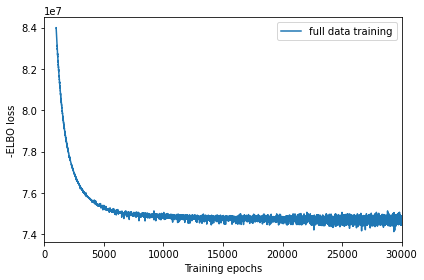

In [76]:
# create and train the model
mod = cell2location.models.Cell2location(
    adata_visium, cell_state_df=inf_aver,
    # the expected average cell abundance: tissue-dependent
    # hyper-prior which can be estimated from paired histology:
    N_cells_per_location=30,
    # hyperparameter controlling normalisation of
    # within-experiment variation in RNA detection (using default here):
    detection_alpha=200
)

mod.train(max_epochs=30000,
          # train using full data (batch_size=None)
          batch_size=None,
          # use all data points in training because
          # we need to estimate cell abundance at all locations
          train_size=1,
          use_gpu=True)

# plot ELBO loss history during training, removing first 100 epochs from the plot
mod.plot_history(1000)
plt.legend(labels=['full data training']);

In [77]:
# making index unique
adata_visium.obs.index = [barcode + '_' + sample for barcode,sample in zip(adata_visium.obs.index,
                                                                          adata_visium.obs['sample'])]

In [78]:
f"{run_name}/sp.h5ad"

'/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/sp.h5ad'

In [79]:
# In this section, we export the estimated cell abundance (summary of the posterior distribution).
adata_vis = mod.export_posterior(
    adata_visium, sample_kwargs={'num_samples': 1000, 'batch_size': mod.adata.n_obs, 'use_gpu': True}
)

# Save model
mod.save(f"{run_name}", overwrite=True)

# mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

# Save anndata object with results
adata_file = f"{run_name}/sp.h5ad"
adata_vis.write(adata_file)
adata_file

Sampling global variables, sample: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 999/999 [01:15<00:00, 13.27it/s]


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'sample' as categorical
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'spotID' as categorical
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'feature_types' as categorical
/opt/conda/envs

'/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/sp.h5ad'

## Visualising results

In [3]:
results_folder = '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/in_vivo_onto_in_vivo_mapping/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter/'

# create paths and names to results folders for reference regression and cell2location models
ref_run_name = f'{results_folder}/reference_signatures'
run_name = f'{results_folder}/cell2location_map'

In [4]:
adata_file = f"{run_name}/sp.h5ad"
adata_vis = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)


INFO     Using data from adata.X                                                             


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.


INFO     Registered keys:['X', 'batch_indices', 'labels', 'ind_x']                           
INFO     Successfully registered anndata object containing 27260 cells, 14476 vars, 8        
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Preparing underlying module for load                                                


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/pytorch_lightning/trainer/configuration_validator.py:99: UserWarning: you passed in a val_dataloader but have no validation_step. Skipping val loop
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 1/30000:   0%|                                                                                                                      | 1/30000 [00:00<3:29:34,  2.39it/s, v_num=1, elbo_train=1.3e+8]


In [5]:
adata_vis

AnnData object with n_obs × n_vars = 27260 × 14476
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'barcode_sample', 'batch', 'spotID', '_scvi_batch', '_scvi_labels', '_indices'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi', 'mod'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [6]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,barcode_sample,batch,spotID,_scvi_batch,_scvi_labels,_indices
AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764,1,50,102,34914_WS_PLA_S9101764,AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764,0,AAACAAGTATCTCCCA-1,2,0,0
AAACAATCTACTAGCA-1_34914_WS_PLA_S9101764,1,3,43,34914_WS_PLA_S9101764,AAACAATCTACTAGCA-1_34914_WS_PLA_S9101764,0,AAACAATCTACTAGCA-1,2,0,1
AAACACCAATAACTGC-1_34914_WS_PLA_S9101764,1,59,19,34914_WS_PLA_S9101764,AAACACCAATAACTGC-1_34914_WS_PLA_S9101764,0,AAACACCAATAACTGC-1,2,0,2
AAACAGAGCGACTCCT-1_34914_WS_PLA_S9101764,1,14,94,34914_WS_PLA_S9101764,AAACAGAGCGACTCCT-1_34914_WS_PLA_S9101764,0,AAACAGAGCGACTCCT-1,2,0,3
AAACAGCTTTCAGAAG-1_34914_WS_PLA_S9101764,1,43,9,34914_WS_PLA_S9101764,AAACAGCTTTCAGAAG-1_34914_WS_PLA_S9101764,0,AAACAGCTTTCAGAAG-1,2,0,4
...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737,1,31,77,36173_Pla_Camb9518737,TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737,7,TTGTTGTGTGTCAAGA-1,6,0,27255
TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737,1,58,42,36173_Pla_Camb9518737,TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737,7,TTGTTTCACATCCAGG-1,6,0,27256
TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737,1,60,30,36173_Pla_Camb9518737,TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737,7,TTGTTTCATTAGTCTA-1,6,0,27257
TTGTTTCCATACAACT-1_36173_Pla_Camb9518737,1,45,27,36173_Pla_Camb9518737,TTGTTTCCATACAACT-1_36173_Pla_Camb9518737,7,TTGTTTCCATACAACT-1,6,0,27258


In [7]:
# reading adatas 
IDs = ['34914_WS_PLA_S9101764', # P13 main 4 chips
           '34914_WS_PLA_S9101765',
           '34914_WS_PLA_S9101766',
           '34914_WS_PLA_S9101767',
           '34882_WS_PLA_S9101769', # P!4 2 chips
           '34882_WS_PLA_S9101770',
           
           # from batch 2
           '36173_Pla_HDBR9518710', # Hrv43
           '36173_Pla_Camb9518737', # P13 extra chip
           
          ]

adatas_visium = {}

for ID in IDs:
    print(ID)
    
    if ID in ['34914_WS_PLA_S9101764', # P13 main 4 chips
           '34914_WS_PLA_S9101765',
           '34914_WS_PLA_S9101766',
           '34914_WS_PLA_S9101767',
           '34882_WS_PLA_S9101769', # P!4 2 chips
           '34882_WS_PLA_S9101770',]:
        path = '/lustre/scratch117/cellgen/team292/aa22/data/202008_MFI_Visium/20200901_new_data_spaceranger110/spaceranger110_count_' + ID + '_GRCh38-3_0_0-premrna/'
    if ID in ['36173_Pla_HDBR9518710', # Hrv43
           '36173_Pla_Camb9518737', # P13 extra chip
             ]:
        path = '/lustre/scratch117/cellgen/team292/aa22/data/202103_MFI_Visium_batch_2/spaceranger110_count_' + ID + '_GRCh38-3_0_0_premrna/'
           
    
    adatas_visium[ID] = sc.read_visium(path)
    adatas_visium[ID].obs['sample'] = ID
    adatas_visium[ID].obs['barcode_sample'] = [idx + '_' + ID for idx in adatas_visium[ID].obs_names]
    adatas_visium[ID].obs.set_index('barcode_sample', inplace=True)
    adatas_visium[ID].var_names_make_unique()
    

34914_WS_PLA_S9101764


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34914_WS_PLA_S9101765


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34914_WS_PLA_S9101766


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34914_WS_PLA_S9101767


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34882_WS_PLA_S9101769


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


34882_WS_PLA_S9101770


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


36173_Pla_HDBR9518710


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


36173_Pla_Camb9518737


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [8]:
for ID in IDs:
    print(ID)    
    for col in adata_vis.obsm['q05_cell_abundance_w_sf']:
        col_chopped = col[23:]
        #print(col_chopped)
        curr_subset_adata_vis = adata_vis[adata_vis.obs['sample'] == ID]
        adatas_visium[ID].obs[col_chopped] = curr_subset_adata_vis.obsm['q05_cell_abundance_w_sf'].loc[adatas_visium[ID].obs_names, col]
        

34914_WS_PLA_S9101764
34914_WS_PLA_S9101765
34914_WS_PLA_S9101766
34914_WS_PLA_S9101767
34882_WS_PLA_S9101769
34882_WS_PLA_S9101770
36173_Pla_HDBR9518710
36173_Pla_Camb9518737


In [9]:
adatas_visium[ID].obs

,in_tissue,array_row,array_col,sample,B_cells,DC,EVT_1,EVT_2,Endo_F,Endo_L,...,dS1,dS2,dS3,dT_cells,dT_regs,eEVT,fF1,fF2,iEVT,uSMC
barcode_sample,,,,,,,,,,,,,,,,,,,,,
AAACAAGTATCTCCCA-1_36173_Pla_Camb9518737,1,50,102,36173_Pla_Camb9518737,0.045068,0.080433,0.381414,2.052287,0.060494,0.281842,...,0.532251,0.323234,0.398107,0.090981,0.065913,0.326426,0.081666,0.038792,6.087939,2.434344
AAACACCAATAACTGC-1_36173_Pla_Camb9518737,1,59,19,36173_Pla_Camb9518737,0.001138,0.002047,0.002249,0.003201,0.018786,0.003123,...,0.002100,0.002943,0.013896,0.002420,0.001108,0.000652,0.011312,0.030382,0.000215,0.001494
AAACAGCTTTCAGAAG-1_36173_Pla_Camb9518737,1,43,9,36173_Pla_Camb9518737,0.006246,0.006123,0.023019,0.030816,0.068029,0.007709,...,0.006058,0.007157,0.026078,0.006711,0.004198,0.006065,0.061600,0.208640,0.001424,0.005191
AAACAGGGTCTATATT-1_36173_Pla_Camb9518737,1,47,13,36173_Pla_Camb9518737,0.001833,0.004060,0.003193,0.002877,0.017572,0.006738,...,0.010382,0.003424,0.011248,0.003532,0.001620,0.000725,0.350841,0.089923,0.000202,0.106029
AAACAGTGTTCCTGGG-1_36173_Pla_Camb9518737,1,73,43,36173_Pla_Camb9518737,0.000264,0.000179,0.000088,0.000037,0.000918,0.000463,...,0.000966,0.000708,0.003426,0.000393,0.000121,0.000061,0.002861,0.001232,0.000033,0.000454
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737,1,31,77,36173_Pla_Camb9518737,0.019438,0.028318,0.161972,1.092586,0.020644,0.017452,...,0.051258,0.170513,0.583205,0.027985,0.019144,0.204748,0.016574,0.012625,2.994178,0.063708
TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737,1,58,42,36173_Pla_Camb9518737,0.001759,0.004271,0.002581,0.026469,0.004719,0.003365,...,0.002373,0.018449,0.796988,0.002386,0.000934,0.008839,0.008699,0.006368,0.001758,0.002350
TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737,1,60,30,36173_Pla_Camb9518737,0.000322,0.001080,0.000446,0.013098,0.001566,0.001067,...,0.001357,0.002322,0.095372,0.000757,0.000285,0.008536,0.001380,0.001197,0.009167,0.001142


In [10]:
# Now we use cell2location plotter that allows showing multiple cell types in one panel
from cell2location.plt import plot_spatial


In [11]:
plots_save_path = results_folder

In [12]:
# to make text modifyable in adobe illustrator
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

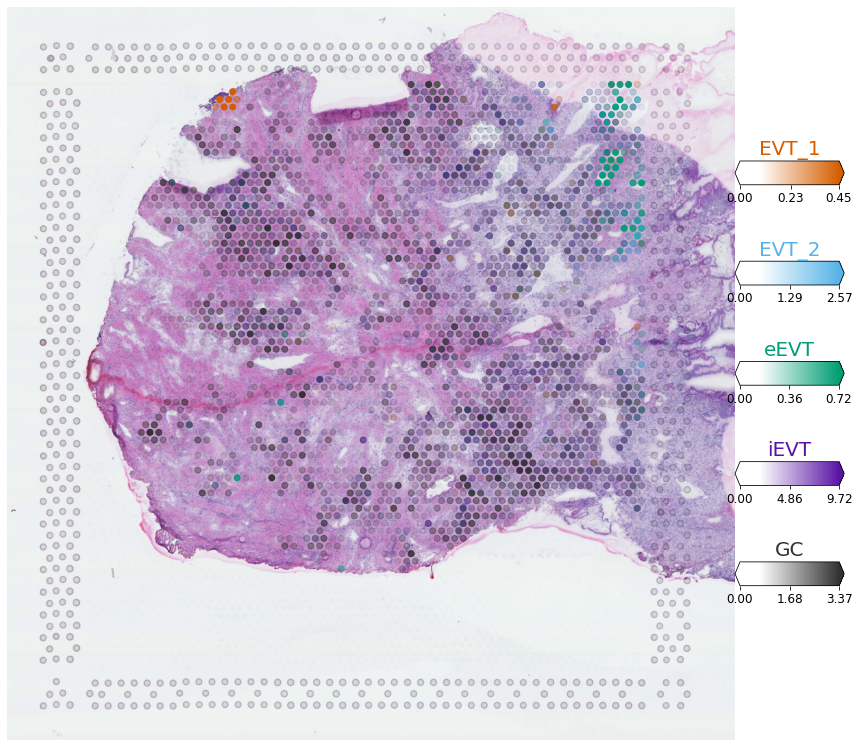

In [13]:
# slide 64

# select up to 6 clusters
clust_labels = [#'VCT_CCC',
    'EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34914_WS_PLA_S9101764']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [#0,
            1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        colorbar_position='right'
    )

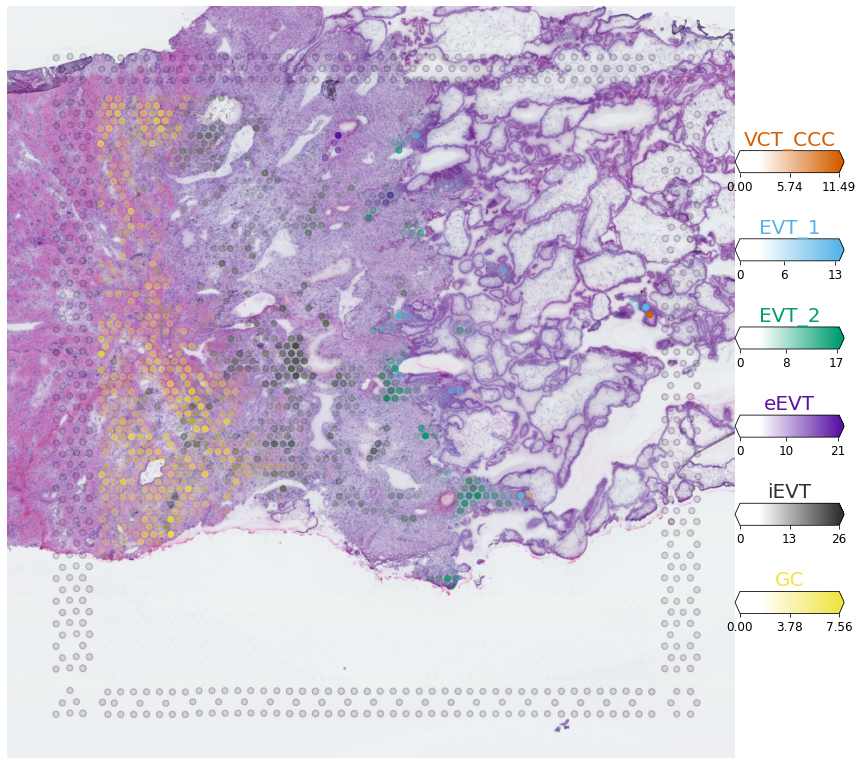

In [16]:
# slide 65

# select up to 6 clusters
clust_labels = ['VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34914_WS_PLA_S9101765']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=1.0,
        #alpha_scaling=0.2,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [1,2,3,4,6,0], #['yellow' 0 , 'orange' 1, 'blue' 2, 'green' 3, 'purple' 4, 'grey' 5, 'white' 6],
        colorbar_position='right'
    )
    
fig.savefig(plots_save_path + 'chip_34914_WS_PLA_S9101765_maxcolorquantile_1.0_alpha_1.0_HnE_hires_cell_density.pdf',
                    bbox_inches='tight', dpi=1200)


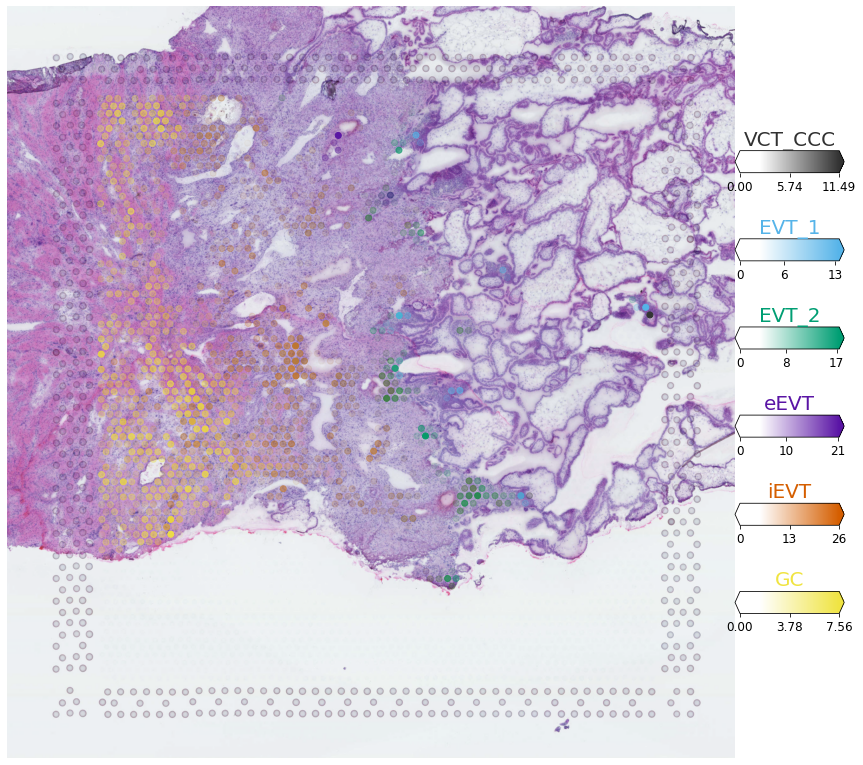

In [14]:
# slide 65
# additional plot where for iEVT we use orange scale instead of grey

# select up to 6 clusters
clust_labels = ['VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34914_WS_PLA_S9101765']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=1.0,
        #alpha_scaling=0.2,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [6,2,3,4,1,0], #['yellow' 0 , 'orange' 1, 'blue' 2, 'green' 3, 'purple' 4, 'grey' 5, 'white' 6],
        colorbar_position='right'
    )
    
fig.savefig(plots_save_path + 'chip_34914_WS_PLA_S9101765_maxcolorquantile_1.0_alpha_1.0_HnE_hires_cell_density_additional_plot_iEVT_red_scale.pdf',
                    bbox_inches='tight', dpi=1200)


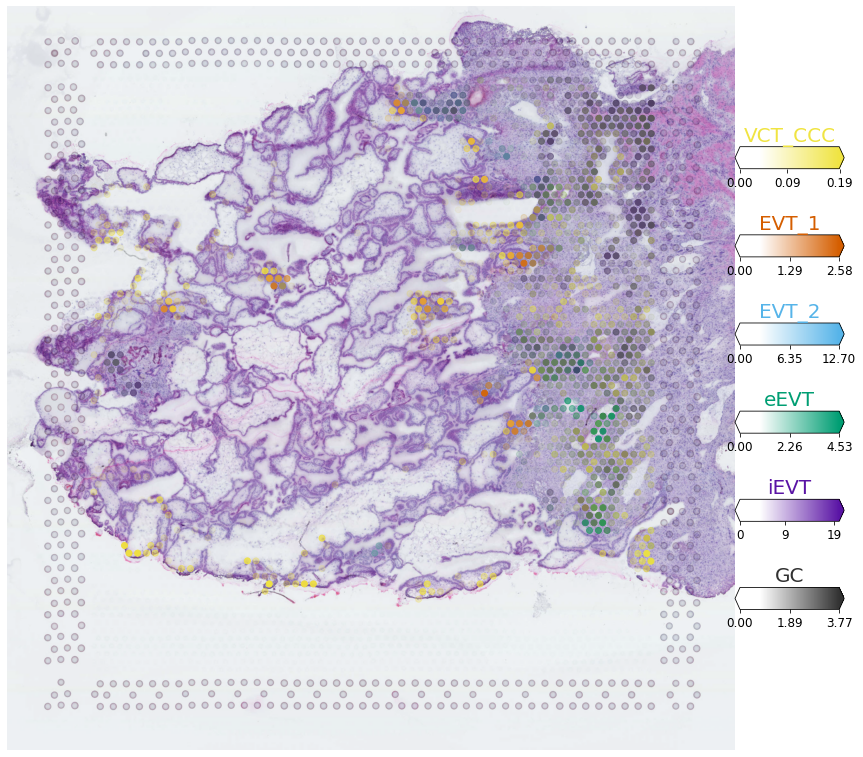

In [15]:
# slide 66

# select up to 6 clusters
clust_labels = ['VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34914_WS_PLA_S9101766']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [0,1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        colorbar_position='right'
    )

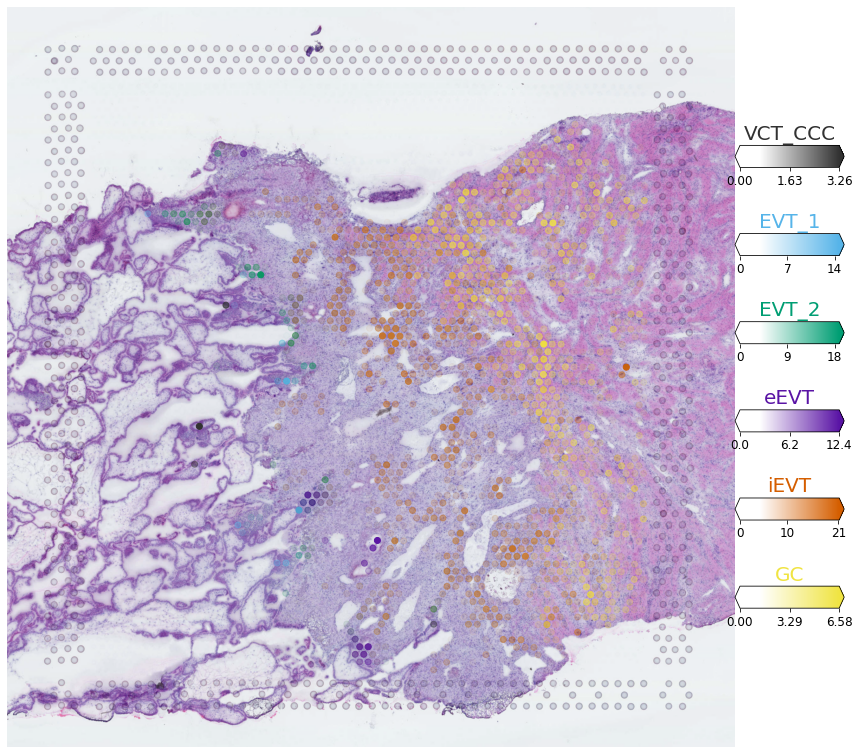

In [16]:
# slide 67
# additional plot where for iEVT we use orange scale instead of grey

# select up to 6 clusters
clust_labels = ['VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34914_WS_PLA_S9101767']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=1.0,
        #alpha_scaling=0.2,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [6,2,3,4,1,0], #['yellow' 0 , 'orange' 1, 'blue' 2, 'green' 3, 'purple' 4, 'grey' 5, 'white' 6],
        colorbar_position='right'
    )
    
fig.savefig(plots_save_path + 'chip_34914_WS_PLA_S9101767_maxcolorquantile_1.0_alpha_1.0_HnE_hires_cell_density_additional_plot_iEVT_red_scale.pdf',
                    bbox_inches='tight', dpi=1200)


ERROR! Session/line number was not unique in database. History logging moved to new session 2


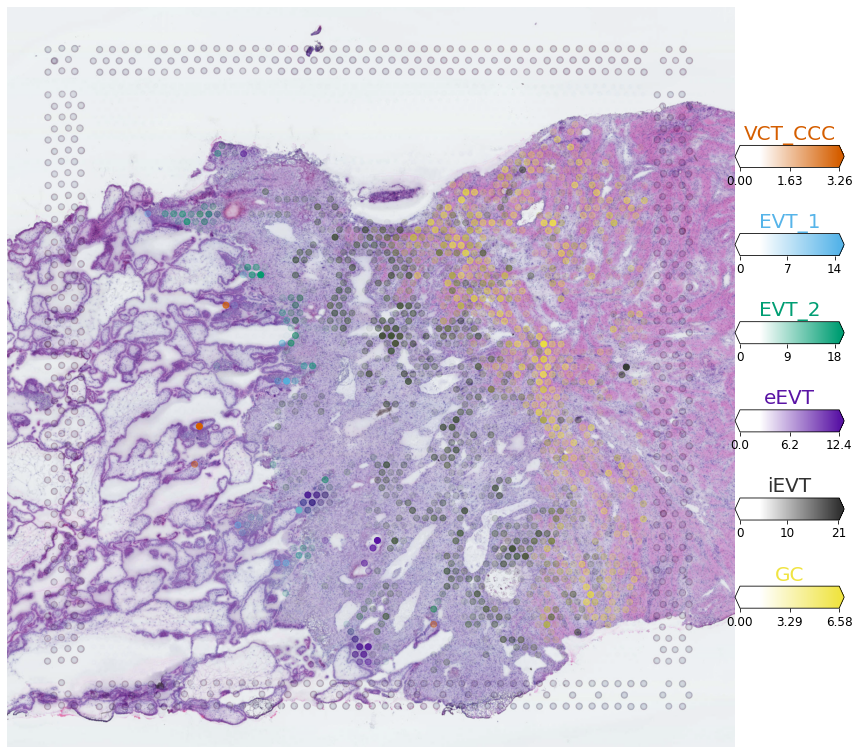

In [15]:
# slide 67

# select up to 6 clusters
clust_labels = ['VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34914_WS_PLA_S9101767']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=1.0,
        #alpha_scaling=0.2,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [1,2,3,4,6,0], #['yellow' 0 , 'orange' 1, 'blue' 2, 'green' 3, 'purple' 4, 'grey' 5, 'white' 6],
        colorbar_position='right'
    )
    
fig.savefig(plots_save_path + 'chip_34914_WS_PLA_S9101767_maxcolorquantile_1.0_alpha_1.0_HnE_hires_cell_density.pdf',
                    bbox_inches='tight', dpi=1200)


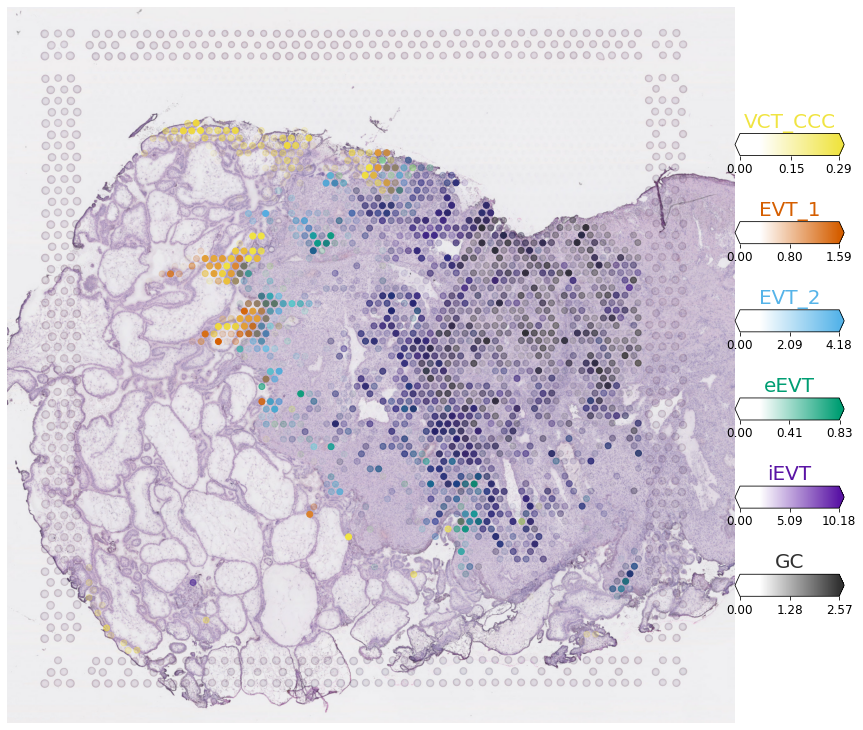

In [17]:
# slide 37

# select up to 6 clusters
clust_labels = ['VCT_CCC','EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['36173_Pla_Camb9518737']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [0,1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        colorbar_position='right'
    )

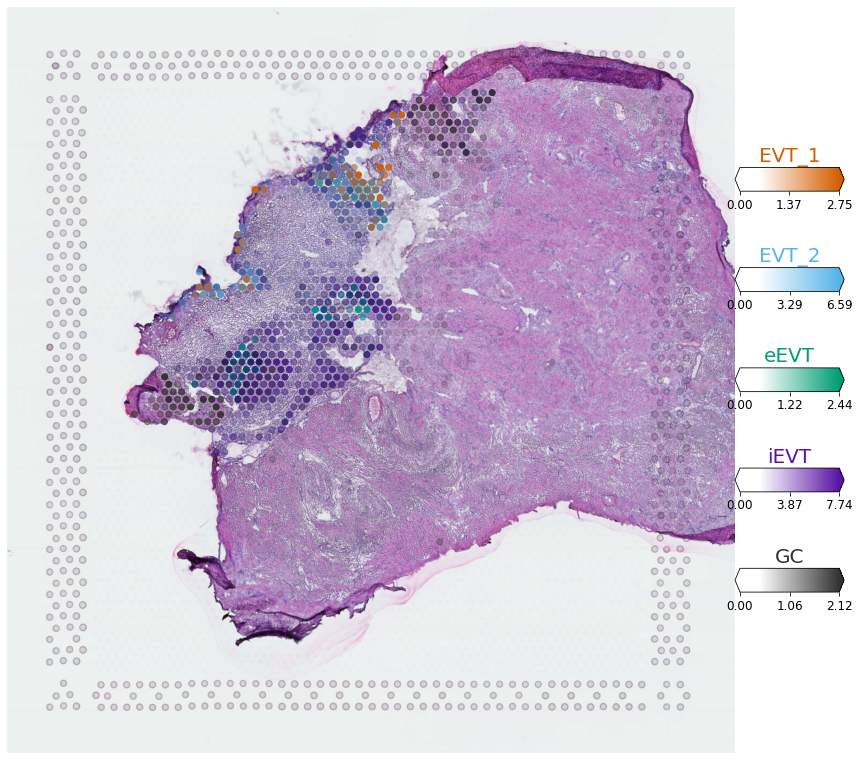

In [18]:
# slide 69

# select up to 6 clusters
clust_labels = [#'VCT_CCC',
    'EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34882_WS_PLA_S9101769']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=0.992,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [#0,
            1,2,3,4,6], #['yellow', 'orange', 'blue', 'green', 'purple', 'grey', 'white'],
        colorbar_position='right'
    )

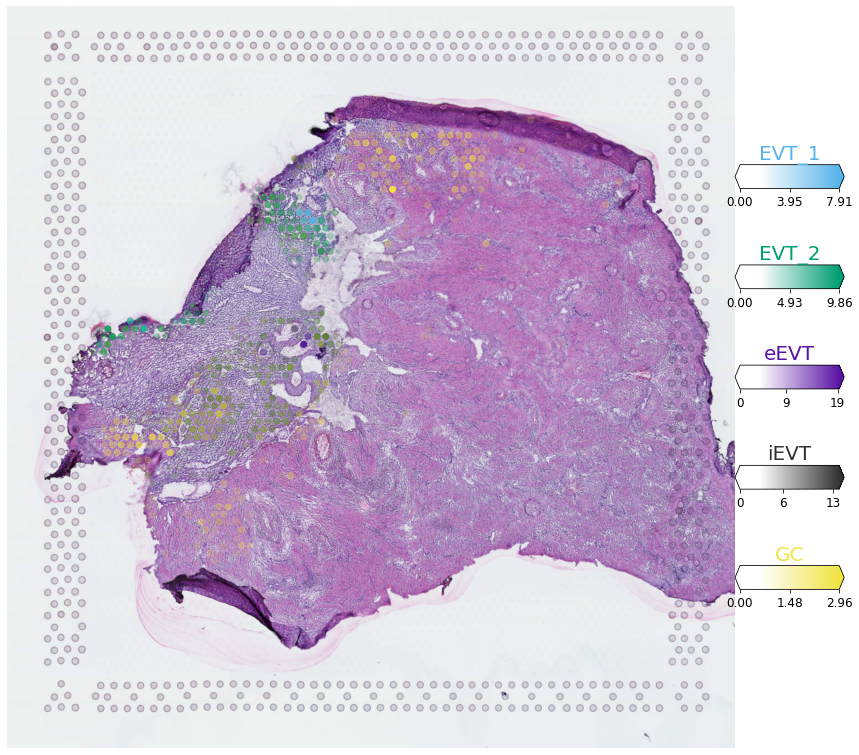

In [18]:
# slide 70

# select up to 6 clusters
clust_labels = [#'VCT_CCC',
    'EVT_1','EVT_2','eEVT','iEVT','GC']
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['34882_WS_PLA_S9101770']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=1.0,
        #alpha_scaling=0.2,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [#1,
            2,3,4,6,0], #['yellow' 0 , 'orange' 1, 'blue' 2, 'green' 3, 'purple' 4, 'grey' 5, 'white' 6],
        colorbar_position='right'
    )
    
fig.savefig(plots_save_path + 'chip_34882_WS_PLA_S9101770_maxcolorquantile_1.0_alpha_1.0_HnE_hires_cell_density.pdf',
                    bbox_inches='tight', dpi=1200)


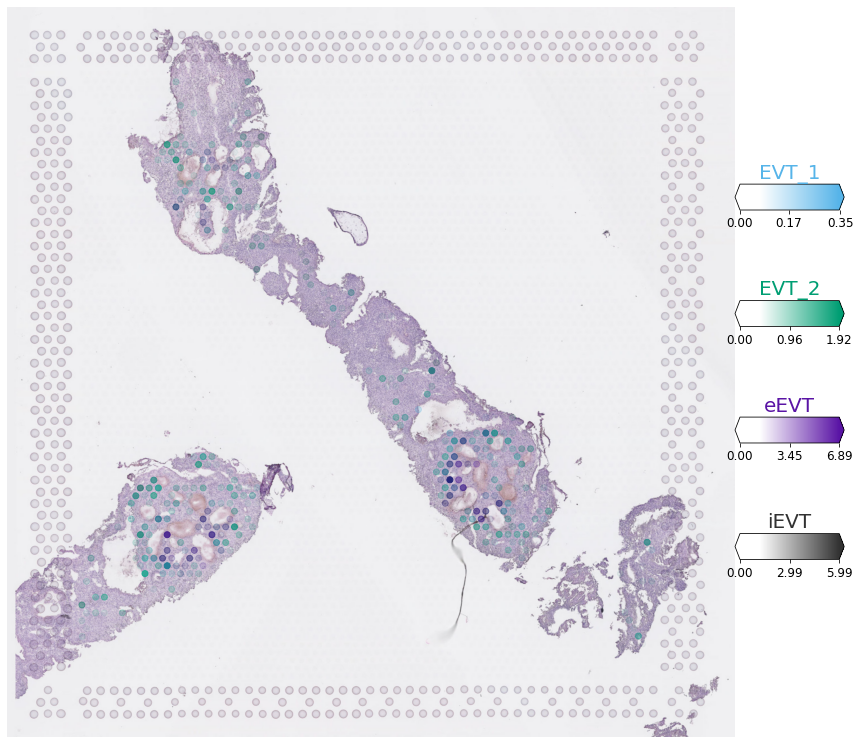

In [19]:
# slide 10

# select up to 6 clusters
clust_labels = [#'VCT_CCC',
    'EVT_1','EVT_2','eEVT','iEVT',
    #'GC'
]
clust_col = ['' + str(i) for i in clust_labels] # in case column names differ from labels

# select one slide
#from cell2location.utils import select_slide
slide = adatas_visium['36173_Pla_HDBR9518710']#select_slide(adata_vis, '34914_WS_PLA_S9101764')

with mpl.rc_context({'figure.figsize': (15, 15)}):
    fig = plot_spatial(
        adata=slide,
        # labels to show on a plot
        color=clust_col, labels=clust_labels,
        show_img=True,
        # 'fast' (white background) or 'dark_background'
        style='fast',
        # limit color scale at 99.2% quantile of cell abundance
        max_color_quantile=1.0,
        #alpha_scaling=0.2,
        # size of locations (adjust depending on figure size)
        circle_diameter=6,
        reorder_cmap = [#1,
            2,3,4,6,
            #0
        ], #['yellow' 0 , 'orange' 1, 'blue' 2, 'green' 3, 'purple' 4, 'grey' 5, 'white' 6],
        colorbar_position='right'
    )
    
fig.savefig(plots_save_path + 'chip_36173_Pla_HDBR9518710_maxcolorquantile_1.0_alpha_1.0_HnE_hires_cell_density.pdf',
                    bbox_inches='tight', dpi=1200)


### Code below is old and is no longer used

# Identifying groups of co-located cell types using matrix factorisation


In [21]:
# here using my SpatialDE2-derived tissue segmentation regions
adata_vis

AnnData object with n_obs × n_vars = 27260 × 14476
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'barcode_sample', 'batch', 'spotID', '_scvi_batch', '_scvi_labels', '_indices'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi', 'mod'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [23]:
# reading in region assignment of spots
regions = {}

for ID in IDs:
    print(ID)
    regions[ID] = pd.read_csv('/nfs/team292/aa22/SpatialDE_colocation_model_related/Visium_regions_of_spots/20211123_spot_assignment_to_regions_SpatialDE2_tissue_segmentation_chip_' + ID + '.csv', 
                              index_col=0)    
    #regions[ID].index = [idx + '_WS_' + ID for idx in regions[ID].index]
    adatas_visium[ID].obs['region'] = regions[ID].loc[adatas_visium[ID].obs_names,'region']
    print('regions in this Visium chip:', np.unique(adatas_visium[ID].obs['region'], return_counts=True), '\n')

34914_WS_PLA_S9101764
regions in this Visium chip: (array(['decidua_and_villi_tips', 'myometrium'], dtype=object), array([1083, 2485])) 

34914_WS_PLA_S9101765
regions in this Visium chip: (array(['decidua_and_villi_tips', 'myometrium', 'placenta'], dtype=object), array([1677,  680, 1498])) 

34914_WS_PLA_S9101766
regions in this Visium chip: (array(['decidua_and_villi_tips', 'myometrium', 'placenta'], dtype=object), array([1175,   76, 2628])) 

34914_WS_PLA_S9101767
regions in this Visium chip: (array(['decidua_and_villi_tips', 'myometrium', 'placenta'], dtype=object), array([1924, 1178, 1084])) 

34882_WS_PLA_S9101769
regions in this Visium chip: (array(['decidua_and_villi_tips', 'lowQ_or_not_under_tissue', 'myometrium'],
      dtype=object), array([ 669,  547, 1914])) 

34882_WS_PLA_S9101770
regions in this Visium chip: (array(['decidua_and_villi_tips', 'lowQ_or_not_under_tissue', 'myometrium'],
      dtype=object), array([ 624,  153, 2578])) 

36173_Pla_HDBR9518710
regions in this 

In [24]:
# concatenate the object and assign region labels into adata_vis object
adatas_visium_concat = adatas_visium['34914_WS_PLA_S9101764'].concatenate(list(adatas_visium.values())[1:], join='outer')


In [32]:
adatas_visium_concat.obs

,in_tissue,array_row,array_col,sample,B_cells,DC,EVT_1,EVT_2,Endo_F,Endo_L,...,dS3,dT_cells,dT_regs,eEVT,fF1,fF2,iEVT,uSMC,region,batch
barcode_sample,,,,,,,,,,,,,,,,,,,,,
AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764-0,1,50,102,34914_WS_PLA_S9101764,0.060838,0.146822,0.158687,0.851788,0.038806,0.746049,...,0.211407,0.075955,0.089355,0.154827,0.154210,0.067015,3.772072,10.303452,myometrium,0
AAACAATCTACTAGCA-1_34914_WS_PLA_S9101764-0,1,3,43,34914_WS_PLA_S9101764,0.071699,0.368816,0.013914,0.011455,0.080254,1.577463,...,0.250685,0.125899,0.160814,0.006453,0.457115,0.274455,0.010157,14.068544,myometrium,0
AAACACCAATAACTGC-1_34914_WS_PLA_S9101764-0,1,59,19,34914_WS_PLA_S9101764,0.015815,0.082095,0.001110,0.000398,0.015795,0.620762,...,0.046577,0.026094,0.037021,0.000772,0.124578,0.031312,0.000769,11.321204,myometrium,0
AAACAGAGCGACTCCT-1_34914_WS_PLA_S9101764-0,1,14,94,34914_WS_PLA_S9101764,0.033652,0.050152,0.045669,0.387620,0.044682,0.249089,...,1.776880,0.050005,0.044988,0.065874,0.042044,0.019016,2.247340,1.461058,decidua_and_villi_tips,0
AAACAGCTTTCAGAAG-1_34914_WS_PLA_S9101764-0,1,43,9,34914_WS_PLA_S9101764,0.097381,0.389111,0.004886,0.002983,0.051698,1.420937,...,0.557351,0.106435,0.224961,0.002202,0.411167,0.138087,0.001726,11.918576,myometrium,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737-7,1,31,77,36173_Pla_Camb9518737,0.019438,0.028318,0.161972,1.092586,0.020644,0.017452,...,0.583205,0.027985,0.019144,0.204748,0.016574,0.012625,2.994178,0.063708,decidua_and_villi_tips,7
TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737-7,1,58,42,36173_Pla_Camb9518737,0.001759,0.004271,0.002581,0.026469,0.004719,0.003365,...,0.796988,0.002386,0.000934,0.008839,0.008699,0.006368,0.001758,0.002350,decidua_and_villi_tips,7
TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737-7,1,60,30,36173_Pla_Camb9518737,0.000322,0.001080,0.000446,0.013098,0.001566,0.001067,...,0.095372,0.000757,0.000285,0.008536,0.001380,0.001197,0.009167,0.001142,placenta,7


In [33]:
'AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764-0'[:-2]

'AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764'

In [34]:
# get rid of '-1', '-2' etc. here from concatenation
adatas_visium_concat.obs.index = [elem[:-2] for elem in adatas_visium_concat.obs.index]
adatas_visium_concat.obs

,in_tissue,array_row,array_col,sample,B_cells,DC,EVT_1,EVT_2,Endo_F,Endo_L,...,dS3,dT_cells,dT_regs,eEVT,fF1,fF2,iEVT,uSMC,region,batch
AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764,1,50,102,34914_WS_PLA_S9101764,0.060838,0.146822,0.158687,0.851788,0.038806,0.746049,...,0.211407,0.075955,0.089355,0.154827,0.154210,0.067015,3.772072,10.303452,myometrium,0
AAACAATCTACTAGCA-1_34914_WS_PLA_S9101764,1,3,43,34914_WS_PLA_S9101764,0.071699,0.368816,0.013914,0.011455,0.080254,1.577463,...,0.250685,0.125899,0.160814,0.006453,0.457115,0.274455,0.010157,14.068544,myometrium,0
AAACACCAATAACTGC-1_34914_WS_PLA_S9101764,1,59,19,34914_WS_PLA_S9101764,0.015815,0.082095,0.001110,0.000398,0.015795,0.620762,...,0.046577,0.026094,0.037021,0.000772,0.124578,0.031312,0.000769,11.321204,myometrium,0
AAACAGAGCGACTCCT-1_34914_WS_PLA_S9101764,1,14,94,34914_WS_PLA_S9101764,0.033652,0.050152,0.045669,0.387620,0.044682,0.249089,...,1.776880,0.050005,0.044988,0.065874,0.042044,0.019016,2.247340,1.461058,decidua_and_villi_tips,0
AAACAGCTTTCAGAAG-1_34914_WS_PLA_S9101764,1,43,9,34914_WS_PLA_S9101764,0.097381,0.389111,0.004886,0.002983,0.051698,1.420937,...,0.557351,0.106435,0.224961,0.002202,0.411167,0.138087,0.001726,11.918576,myometrium,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737,1,31,77,36173_Pla_Camb9518737,0.019438,0.028318,0.161972,1.092586,0.020644,0.017452,...,0.583205,0.027985,0.019144,0.204748,0.016574,0.012625,2.994178,0.063708,decidua_and_villi_tips,7
TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737,1,58,42,36173_Pla_Camb9518737,0.001759,0.004271,0.002581,0.026469,0.004719,0.003365,...,0.796988,0.002386,0.000934,0.008839,0.008699,0.006368,0.001758,0.002350,decidua_and_villi_tips,7
TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737,1,60,30,36173_Pla_Camb9518737,0.000322,0.001080,0.000446,0.013098,0.001566,0.001067,...,0.095372,0.000757,0.000285,0.008536,0.001380,0.001197,0.009167,0.001142,placenta,7
TTGTTTCCATACAACT-1_36173_Pla_Camb9518737,1,45,27,36173_Pla_Camb9518737,0.000988,0.001388,0.002267,0.015401,0.005503,0.002593,...,0.226025,0.001280,0.000865,0.001509,0.022343,0.066314,0.002453,0.005129,placenta,7


In [27]:
adata_vis.obs

,in_tissue,array_row,array_col,sample,barcode_sample,batch,spotID,_scvi_batch,_scvi_labels,_indices
AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764,1,50,102,34914_WS_PLA_S9101764,AAACAAGTATCTCCCA-1_34914_WS_PLA_S9101764,0,AAACAAGTATCTCCCA-1,2,0,0
AAACAATCTACTAGCA-1_34914_WS_PLA_S9101764,1,3,43,34914_WS_PLA_S9101764,AAACAATCTACTAGCA-1_34914_WS_PLA_S9101764,0,AAACAATCTACTAGCA-1,2,0,1
AAACACCAATAACTGC-1_34914_WS_PLA_S9101764,1,59,19,34914_WS_PLA_S9101764,AAACACCAATAACTGC-1_34914_WS_PLA_S9101764,0,AAACACCAATAACTGC-1,2,0,2
AAACAGAGCGACTCCT-1_34914_WS_PLA_S9101764,1,14,94,34914_WS_PLA_S9101764,AAACAGAGCGACTCCT-1_34914_WS_PLA_S9101764,0,AAACAGAGCGACTCCT-1,2,0,3
AAACAGCTTTCAGAAG-1_34914_WS_PLA_S9101764,1,43,9,34914_WS_PLA_S9101764,AAACAGCTTTCAGAAG-1_34914_WS_PLA_S9101764,0,AAACAGCTTTCAGAAG-1,2,0,4
...,...,...,...,...,...,...,...,...,...,...
TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737,1,31,77,36173_Pla_Camb9518737,TTGTTGTGTGTCAAGA-1_36173_Pla_Camb9518737,7,TTGTTGTGTGTCAAGA-1,6,0,27255
TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737,1,58,42,36173_Pla_Camb9518737,TTGTTTCACATCCAGG-1_36173_Pla_Camb9518737,7,TTGTTTCACATCCAGG-1,6,0,27256
TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737,1,60,30,36173_Pla_Camb9518737,TTGTTTCATTAGTCTA-1_36173_Pla_Camb9518737,7,TTGTTTCATTAGTCTA-1,6,0,27257
TTGTTTCCATACAACT-1_36173_Pla_Camb9518737,1,45,27,36173_Pla_Camb9518737,TTGTTTCCATACAACT-1_36173_Pla_Camb9518737,7,TTGTTTCCATACAACT-1,6,0,27258


In [35]:
len(set(adata_vis.obs_names) & set(adatas_visium_concat.obs_names))

27260

In [36]:
adata_vis.obs['region'] = adatas_visium_concat.obs.loc[adata_vis.obs_names,'region']

In [37]:
adata_vis.obs['region'] = adata_vis.obs['region'].astype("category")

In [41]:
# split by chip ID and region for colocation model
adatas_vis_c2l = {}

for ID in IDs:
    print(ID)
    
    adatas_vis_c2l[ID] = {}
    
    # regions in current chip
    curr_regions = np.unique(adata_vis[adata_vis.obs['sample'] == ID].obs['region'])
    
    for region in curr_regions:
        print(region)
    
        adatas_vis_c2l[ID][region] = adata_vis[(adata_vis.obs['sample'] == ID)
                                              & (adata_vis.obs['region'] == region)].copy()

34914_WS_PLA_S9101764
decidua_and_villi_tips
myometrium
34914_WS_PLA_S9101765
decidua_and_villi_tips
myometrium
placenta
34914_WS_PLA_S9101766
decidua_and_villi_tips
myometrium
placenta
34914_WS_PLA_S9101767
decidua_and_villi_tips
myometrium
placenta
34882_WS_PLA_S9101769
decidua_and_villi_tips
lowQ_or_not_under_tissue
myometrium
34882_WS_PLA_S9101770
decidua_and_villi_tips
lowQ_or_not_under_tissue
myometrium
36173_Pla_HDBR9518710
decidua_and_villi_tips
36173_Pla_Camb9518737
decidua_and_villi_tips
myometrium
placenta


In [46]:
adatas_vis_c2l[ID][region]

AnnData object with n_obs × n_vars = 1083 × 14476
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'barcode_sample', 'batch', 'spotID', '_scvi_batch', '_scvi_labels', '_indices', 'region'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi', 'mod'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [44]:
# running the colocation model per region - decidua_and_villi_tips and myometrium
# ignoring placenta and lowQ_not_under_tissue regions

from cell2location import run_colocation

for ID in IDs:
    print(ID)
    
    # regions in current chip
    curr_regions = np.unique(adata_vis[adata_vis.obs['sample'] == ID].obs['region'])
    
    # only taking into account myometrium and decidua_and_villi_tips
    curr_regions = list(set(curr_regions) & set(['decidua_and_villi_tips','myometrium']))
    
    for region in curr_regions:
        print(region)
    
        res_dict, adatas_vis_c2l[ID][region] = run_colocation(
            adatas_vis_c2l[ID][region],
            model_name='CoLocatedGroupsSklearnNMF',
            train_args={
              'n_fact': np.arange(5, 30), # IMPORTANT: use a wider range of the number of factors (5-30)
              'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
              'n_restarts': 3 # number of training restarts
            },
            export_args={'path': f'{run_name}/CoLocatedComb/'}
        )

34914_WS_PLA_S9101764
decidua_and_villi_tips
### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead


ValueError: Shape of passed values is (27260, 5), indices imply (1083, 5)

In [45]:
adatas_vis_c2l[ID][region]

AnnData object with n_obs × n_vars = 1083 × 14476
    obs: 'in_tissue', 'array_row', 'array_col', 'sample', 'barcode_sample', 'batch', 'spotID', '_scvi_batch', '_scvi_labels', '_indices', 'region'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: '_scvi', 'mod'
    obsm: 'means_cell_abundance_w_sf', 'q05_cell_abundance_w_sf', 'q95_cell_abundance_w_sf', 'spatial', 'stds_cell_abundance_w_sf'

In [ ]:
# also do this for all-region_X objects? so adata_decidua_

In [47]:
# trying on the whole object yolo

from cell2location import run_colocation

# started at about 10:30 on 25.11.2021

res_dict, adata_vis = run_colocation(
    adata_vis,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': np.arange(5, 30), # IMPORTANT: use a wider range of the number of factors (5-30)
      'sample_name_col': 'sample', # columns in adata_vis.obs that identifies sample
      'n_restarts': 3 # number of training restarts
    },
    export_args={'path': f'{run_name}/CoLocatedComb/'}
)


### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact5_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact6_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_7combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact7_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_8combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact8_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_9combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact9_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_10combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact10_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_11combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact11_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact12_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_13combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact13_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_14combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact14_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_15combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact15_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_16combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact16_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_17combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact17_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_18combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packa

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact18_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_19combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packa

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact19_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_20combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packa

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact20_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_21combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packa

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact21_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_22combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `a

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact22_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_23combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packa

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact23_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_24combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packa

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact24_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_25combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1641: ConvergenceWarning: Maximum number of iterations 20000 reached. Increase it to improve convergence.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packa

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact25_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_26combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact26_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_27combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact27_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_28combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact28_s34914_WS_PLA_S9101764.pdf'
### Analysis name: CoLocatedGroupsSklearnNMF_29combinations_27260locations_40factors


/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/sklearn/decomposition/_nmf.py:1425: FutureWarning: `alpha` was deprecated in version 1.0 and will be removed in 1.2. Use `alpha_W` and `alpha_H` instead
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:721: PlotnineWarning: Saving 24 x 5.7 in image.
/opt/conda/envs/cell2loc_env/lib/python3.7/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: /lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visiu

Some error in plotting with scanpy or `cell2location.plt.plot_factor_spatial()`
 [Errno 2] No such file or directory: '/lustre/scratch117/cellgen/team292/aa22/cell2loc_files/results/20211123_P13_new_full_atlas_SN_and_multiome_updated_onto_all_relevant_Visium_chips_with_LF_gene_filter//cell2location_map/CoLocatedComb/CoLocatedGroupsSklearnNMF_27260locations_40factors/spatial/cell_density_mean_n_fact29_s34914_WS_PLA_S9101764.pdf'


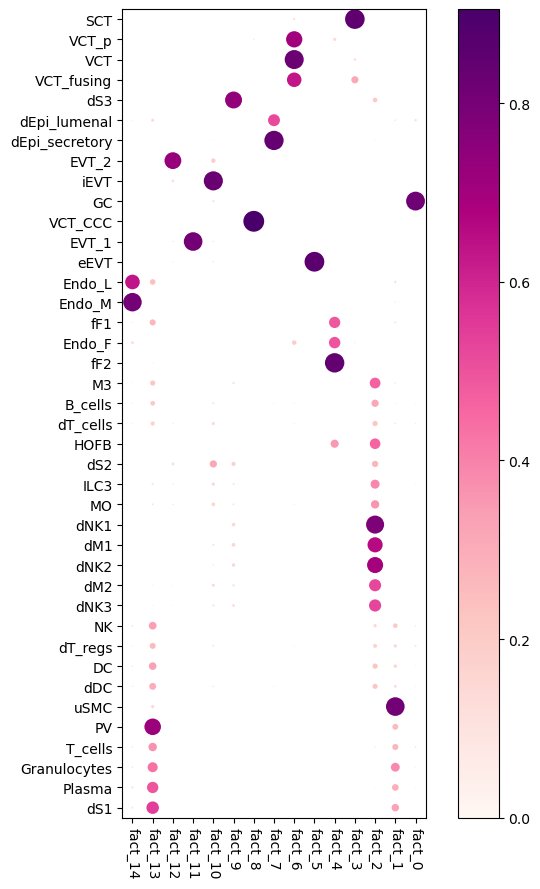

In [51]:
# Here we plot the NMF weights (Same as saved to `cell_type_fractions_heatmap`)
res_dict['n_fact15']['mod'].plot_cell_type_loadings()

In [277]:
adata_vis_full = adata_vis.copy()

In [284]:
# to keep the analysis per slide, otherwise doesn't make sense
adata_vis = adata_vis_full.copy()    #[adata_vis_full.obs['sample'] == '66'].copy()

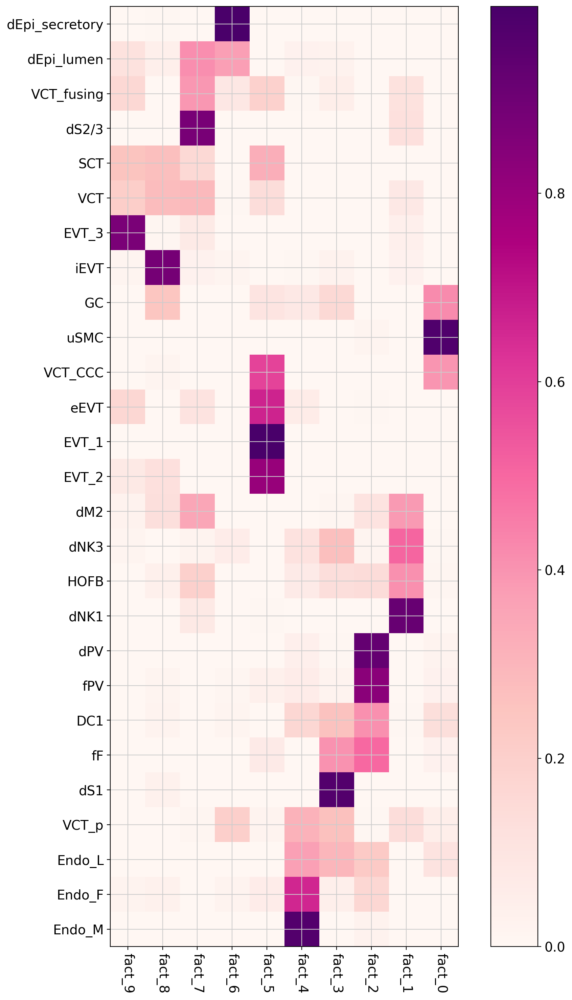

In [290]:
# make nice names
from re import sub
mod_sk.cell_type_fractions.columns = [sub('mean_cell_type_factors', '', i)
                                      for i in mod_sk.cell_type_fractions.columns]

# plot co-occuring cell type combinations
mod_sk.plot_gene_loadings(mod_sk.var_names_read, mod_sk.var_names_read,
                        fact_filt=mod_sk.fact_filt,
                        loadings_attr='cell_type_fractions',
                        gene_fact_name='cell_type_fractions',
                        
                        cmap='RdPu', figsize=[10, 15])

In [291]:
cols2add = ['mean_nUMI_factorsfact_0',
 'mean_nUMI_factorsfact_1',
 'mean_nUMI_factorsfact_2',
 'mean_nUMI_factorsfact_3',
 'mean_nUMI_factorsfact_4',
 'mean_nUMI_factorsfact_5',
 'mean_nUMI_factorsfact_6',
 'mean_nUMI_factorsfact_7',
 'mean_nUMI_factorsfact_8',
 'mean_nUMI_factorsfact_9']


for ID in IDs_P13:
    print(ID)
    for col in cols2add:
        adatas_visium[ID].obs[col] = adata_vis.obs.loc[adatas_visium[ID].obs_names,col]

64
65
66
67


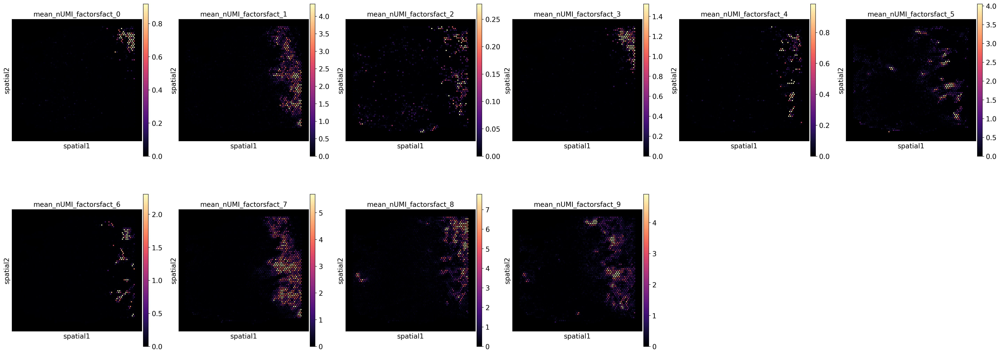

In [292]:
# plot cell density in each combination
with mpl.rc_context({'figure.figsize': (5, 6), 'axes.facecolor': 'black'}):

    # select one section correctly subsetting histology image data
    slide = adatas_visium['66']

    sc.pl.spatial(slide,
                  cmap='magma',
                  color=mod_sk.location_factors_df.columns,
                  ncols=6,
                  size=1, img_key='hires',
                  alpha_img=0,
                  vmin=0, vmax='p99.2'
                 )